In [1]:
import requests
import numpy as np
from sklearn import linear_model, model_selection

import torch
from torch import nn
from torch import optim
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.models import resnet18

import matplotlib.pyplot as plt

In [2]:
from pathlib import Path
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, ToTensor, Grayscale, Normalize, Resize



from transights.utils import FolderScanner as fs
from transights.utils import Pickler
from transights.transforms import (FileToPIL,
                             PILToNumpy,
                             FlattenArray,
                             DebugTransform,
                             ProjectTransform,
                             PyTorchOutput,
                             PyTorchEmbedding,
                             ToDevice,
                             FlattenTensor,
                             CachingTransform)

from transights.aggregator import DataAggregator

#from debugger import log_full


random_state = 23

In [3]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on device:", DEVICE.upper())

Running on device: CUDA


In [4]:
DATA_PATH = Path(r"./data/CIFAR10")
DATA_PATH_TRAIN = Path(DATA_PATH, "train")
DATA_PATH_TEST = Path(DATA_PATH, "test")

train_paths = []

for class_label in range(10):
    class_dir = DATA_PATH_TRAIN / str(class_label)
    train_paths.append(class_dir)
    
train_paths

[PosixPath('data/CIFAR10/train/0'),
 PosixPath('data/CIFAR10/train/1'),
 PosixPath('data/CIFAR10/train/2'),
 PosixPath('data/CIFAR10/train/3'),
 PosixPath('data/CIFAR10/train/4'),
 PosixPath('data/CIFAR10/train/5'),
 PosixPath('data/CIFAR10/train/6'),
 PosixPath('data/CIFAR10/train/7'),
 PosixPath('data/CIFAR10/train/8'),
 PosixPath('data/CIFAR10/train/9')]

In [5]:
test_paths = []

for class_label in range(10):
    class_dir = DATA_PATH_TEST / str(class_label)
    test_paths.append(class_dir)
    
test_paths  

[PosixPath('data/CIFAR10/test/0'),
 PosixPath('data/CIFAR10/test/1'),
 PosixPath('data/CIFAR10/test/2'),
 PosixPath('data/CIFAR10/test/3'),
 PosixPath('data/CIFAR10/test/4'),
 PosixPath('data/CIFAR10/test/5'),
 PosixPath('data/CIFAR10/test/6'),
 PosixPath('data/CIFAR10/test/7'),
 PosixPath('data/CIFAR10/test/8'),
 PosixPath('data/CIFAR10/test/9')]

In [6]:
train_files = fs.get_files(train_paths)
len(train_files)

50000

In [7]:
test_files = fs.get_files(test_paths)
len(test_files)

10000

In [8]:
# download pre-trained weights
response = requests.get(
    "https://unlearning-challenge.s3.eu-west-1.amazonaws.com/weights_resnet18_cifar10.pth"
)
open("weights_resnet18_cifar10.pth", "wb").write(response.content)
weights_pretrained = torch.load("weights_resnet18_cifar10.pth", map_location=DEVICE)

# load model with pre-trained weights
#model = resnet18(weights=None, num_classes=10)
model = resnet18(num_classes=10)
model.load_state_dict(weights_pretrained)
#model.to(DEVICE)
#model.eval();

<All keys matched successfully>

In [9]:
train_embedding_pickle_file = Path(DATA_PATH, "train_embedding_result.pkl")
test_embedding_pickle_file = Path(DATA_PATH, "test_embedding_result.pkl")

train_output_pickle_file = Path(DATA_PATH, "train_output_result.pkl")
test_output_pickle_file = Path(DATA_PATH, "test_output_result.pkl")

# Extract embeddings

In [10]:
# Create the transformation pipeline
transform_pipeline = Compose([
    FileToPIL(),
    ToTensor(),
    Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ToDevice(DEVICE),
    PyTorchEmbedding(model, device=DEVICE),
    ToDevice('cpu'),
    FlattenTensor(),
])

In [11]:
agg = DataAggregator(train_files, transforms=transform_pipeline, batch_size=32)

train_embedding_result = agg.transform(cache_file=train_embedding_pickle_file)

In [12]:
len(train_embedding_result['item'])

50000

In [13]:
agg = DataAggregator(test_files, transforms=transform_pipeline, batch_size=32)

test_embedding_result = agg.transform(cache_file=test_embedding_pickle_file)

In [14]:
len(test_embedding_result['item'])

10000

# Extract outputs

In [15]:
# Create the transformation pipeline
transform_pipeline = Compose([
    FileToPIL(),
    ToTensor(),
    Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
    ToDevice(DEVICE),
    PyTorchOutput(model, device=DEVICE),
    ToDevice('cpu'),
    FlattenTensor(),
])

In [16]:
agg = DataAggregator(train_files, transforms=transform_pipeline, batch_size=32)

train_output_result = agg.transform(cache_file=train_output_pickle_file)

In [17]:
train_output_result['item'][0]

tensor([ 9.0566, -4.3743, -1.3007, -0.7941, -0.5533, -0.2933,  1.7104, -1.1561,
         1.0134, -3.3089])

In [18]:
agg = DataAggregator(test_files, transforms=transform_pipeline, batch_size=32)

test_output_result = agg.transform(cache_file=test_output_pickle_file)

In [19]:
test_output_result['item'][0]

tensor([ 6.4385,  0.3248, -0.5473,  0.2228, -1.1326, -2.7080, -3.1720, -3.3421,
         4.3859, -0.4702])

In [20]:
from umap import UMAP

# Create the UMAP reducer instance
reducer = UMAP(n_neighbors=15, # default 15, The size of local neighborhood (in terms of number of neighboring sample points) used for manifold approximation.
               n_components=2, # default 2, The dimension of the space to embed into.
               metric='euclidean', # default 'euclidean', The metric to use to compute distances in high dimensional space.
               n_epochs=1000, # default None, The number of training epochs to be used in optimizing the low dimensional embedding. Larger values result in more accurate embeddings. 
               learning_rate=1.0, # default 1.0, The initial learning rate for the embedding optimization.
               init='spectral', # default 'spectral', How to initialize the low dimensional embedding. Options are: {'spectral', 'random', A numpy array of initial embedding positions}.
               min_dist=0.1, # default 0.1, The effective minimum distance between embedded points.
               spread=1.0, # default 1.0, The effective scale of embedded points. In combination with ``min_dist`` this determines how clustered/clumped the embedded points are.
               low_memory=False, # default False, For some datasets the nearest neighbor computation can consume a lot of memory. If you find that UMAP is failing due to memory constraints consider setting this option to True.
               set_op_mix_ratio=1.0, # default 1.0, The value of this parameter should be between 0.0 and 1.0; a value of 1.0 will use a pure fuzzy union, while 0.0 will use a pure fuzzy intersection.
               local_connectivity=1, # default 1, The local connectivity required -- i.e. the number of nearest neighbors that should be assumed to be connected at a local level.
               repulsion_strength=1.0, # default 1.0, Weighting applied to negative samples in low dimensional embedding optimization.
               negative_sample_rate=5, # default 5, Increasing this value will result in greater repulsive force being applied, greater optimization cost, but slightly more accuracy.
               transform_queue_size=4.0, # default 4.0, Larger values will result in slower performance but more accurate nearest neighbor evaluation.
               a=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               b=None, # default None, More specific parameters controlling the embedding. If None these values are set automatically as determined by ``min_dist`` and ``spread``.
               random_state=random_state, # default: None, If int, random_state is the seed used by the random number generator;
               metric_kwds=None, # default None) Arguments to pass on to the metric, such as the ``p`` value for Minkowski distance.
               angular_rp_forest=False, # default False, Whether to use an angular random projection forest to initialise the approximate nearest neighbor search.
               target_n_neighbors=-1, # default -1, The number of nearest neighbors to use to construct the target simplcial set. If set to -1 use the ``n_neighbors`` value.
               #target_metric='categorical', # default 'categorical', The metric used to measure distance for a target array is using supervised dimension reduction. By default this is 'categorical' which will measure distance in terms of whether categories match or are different. 
               #target_metric_kwds=None, # dict, default None, Keyword argument to pass to the target metric when performing supervised dimension reduction. If None then no arguments are passed on.
               #target_weight=0.5, # default 0.5, weighting factor between data topology and target topology.
               transform_seed=42, # default 42, Random seed used for the stochastic aspects of the transform operation.
               verbose=False, # default False, Controls verbosity of logging.
               unique=False, # default False, Controls if the rows of your data should be uniqued before being embedded. 
              )

/home/huberc/sw/mambaforge/envs/unlearn/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/huberc/sw/mambaforge/envs/unlearn/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/huberc/sw/mambaforge/envs/unlearn/lib/python3.9/site-pac

In [21]:
import hashlib
import pickle
from sklearn.pipeline import Pipeline
from pathlib import Path

class PipelineCache:
    """
    A class that serves as a wrapper around any sklearn pipeline to cache the results.

    Parameters:
        pipeline (sklearn.pipeline.Pipeline): The sklearn pipeline to be wrapped.
        cache_path (str or pathlib.Path): The directory path where the cache files will be stored.
    """

    def __init__(self, pipeline, cache_path):
        self.pipeline = pipeline
        self.cache_path = Path(cache_path)

    def _get_hash(self, data):
        """
        Compute the MD5 hash value of the input data.

        Parameters:
            data: The data to be hashed.

        Returns:
            str: The computed hash value.
        """
        data_hash = hashlib.md5(pickle.dumps(data)).hexdigest()
        return data_hash

    def _get_cache_file(self, hash_value):
        """
        Generate the cache file path based on the hash value.

        Parameters:
            hash_value (str): The hash value used to form the cache file name.

        Returns:
            Path: The full cache file path.
        """
        filename = hash_value + ".pkl"
        cache_file = self.cache_path / filename
        return cache_file

    def fit(self, X, y=None):
        """
        Fit the pipeline and cache the results if necessary.

        Parameters:
            X: The input data for fitting the pipeline.
            y: The target values for fitting the pipeline. Default is None.

        Returns:
            The fitted pipeline or the cached results.
        """
        hash_value = self._get_hash(X)
        cache_file = self._get_cache_file(hash_value)

        try:
            #TODO: use Pickler
            with open(cache_file, 'rb') as f:
                cached_results = pickle.load(f)
            return cached_results
        except FileNotFoundError:
            results = self.pipeline.fit(X, y)
            #TODO: use Pickler
            with open(cache_file, 'wb') as f:
                pickle.dump(results, f)
            return results

    def transform(self, X):
        """
        Transform the input data using the pipeline and cache the results if necessary.

        Parameters:
            X: The input data for transforming.

        Returns:
            The transformed data or the cached results.
        """
        hash_value = self._get_hash(X)
        cache_file = self._get_cache_file(hash_value)

        try:
            #TODO: use Pickler
            with open(cache_file, 'rb') as f:
                cached_results = pickle.load(f)
            return cached_results
        except FileNotFoundError:
            results = self.pipeline.transform(X)
            #TODO: use Pickler
            with open(cache_file, 'wb') as f:
                pickle.dump(results, f)
            return results

    def predict(self, X):
        """
        Make predictions on the input data using the pipeline and cache the results if necessary.

        Parameters:
            X: The input data for making predictions.

        Returns:
            The predicted values or the cached results.
        """
        hash_value = self._get_hash(X)
        cache_file = self._get_cache_file(hash_value)

        try:
            #TODO: use Pickler
            with open(cache_file, 'rb') as f:
                cached_results = pickle.load(f)
            return cached_results
        except FileNotFoundError:
            results = self.pipeline.predict(X)
            #TODO: use Pickler
            with open(cache_file, 'wb') as f:
                pickle.dump(results, f)
            return results

    def predict_proba(self, X):
        """
        Compute class probabilities on the input data using the pipeline and cache the results if necessary.

        Parameters:
            X: The input data for computing class probabilities.

        Returns:
            The class probabilities or the cached results.
        """
        hash_value = self._get_hash(X)
        cache_file = self._get_cache_file(hash_value)

        try:
            with open(cache_file, 'rb') as f:
                cached_results = pickle.load(f)
            return cached_results
        except FileNotFoundError:
            results = self.pipeline.predict_proba(X)
            with open(cache_file, 'wb') as f:
                pickle.dump(results, f)
            return results

In [22]:
from sklearn.pipeline import Pipeline


# Define the pipeline
pipeline = Pipeline([
    ('umap', reducer),
])


X = train_embedding_result['item']

# TODO: cache
pipeline.fit(X)

Pipeline(steps=[('umap',
                 UMAP(local_connectivity=1, low_memory=False, n_epochs=1000, random_state=23, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True}))])

In [23]:
train_reduced_embedding = pipeline.transform(X)
train_reduced_embedding

array([[-6.3180113, 12.6587925],
       [-6.141349 , 13.758185 ],
       [-7.030947 , 13.318836 ],
       ...,
       [-6.3535104,  1.2781725],
       [-7.3329115,  1.9072343],
       [-5.9636188,  2.1112986]], dtype=float32)

In [202]:
import plotly.express as px
import ipywidgets as widgets


def load_image(filename: str):
    with open(filename, "rb") as f:
            im = f.read()
    return im

def plot_2d(data, color=None, hover_name=None):
    fig = px.scatter(x=data[:, 0],
                     y=data[:, 1],
                     color=color,
                     hover_name=hover_name)
    fig.update_traces(marker=dict(size=3,
                                  line=dict(color='black',
                                            width=0.1)))

    fig.update_layout(width=1000, height=800)

    img = widgets.Image(format='png', width=128)
    img.value = load_image(hover_name[0])
    
    def update(trace, points, state):
        if not points.point_inds:
            return
        
        ind = points.point_inds[0]
        fname = hover_name[ind]
        img.value = load_image(fname)

    fig = go.FigureWidget(fig)
    fig.data[0].on_click(update)

    layout = widgets.Layout(
        width='100%',
        height='',
        flex_flow='row',
        display='flex'
    )
    return widgets.Box([fig, widgets.VBox([widgets.Label(), img, widgets.Label()])], layout=layout)


# def plot_2d(data, color=None, hover_name=None):
#     fig = px.scatter(x=data[:, 0],
#                      y=data[:, 1],
#                      color=color,
#                      hover_name=hover_name)
#     fig.update_traces(marker=dict(size=3,
#                                   line=dict(color='black',
#                                             width=0.1)))
    
#     return fig


# def plot_3d(data, color=None, hover_name=None):
#     fig = px.scatter_3d(x=data[:, 0],
#                         y=data[:, 1],
#                         z=data[:, 2],
#                         color=color,
#                         hover_name=hover_name)
#     fig.update_traces(marker=dict(size=3,
#                                   line=dict(color='black',
#                                             width=0.1)))
    
#     return fig


embedding_2d_fig = plot_2d(data=train_reduced_embedding,
                           color=train_result_y,
                           hover_name=train_embedding_result['file'])
embedding_2d_fig

Box(children=(FigureWidget({
    'data': [{'hovertemplate': ('<b>%{hovertext}</b><br><br>x=%' ... '%{marker.co…

In [25]:
train_result_y = [Path(file).parts[-2] for file in train_embedding_result['file']]
train_result_y = np.array(train_result_y).astype('int')

In [26]:
train_reduced_embedding.shape

(50000, 2)

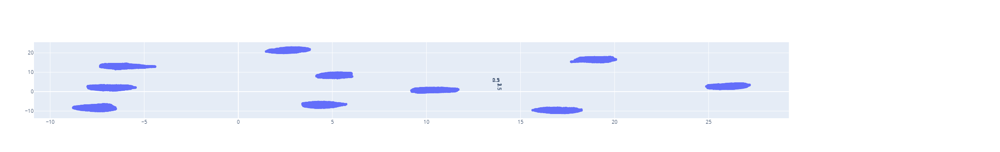

In [64]:
embedding_2d_fig = plot_2d(data=train_reduced_embedding,
                           color=train_result_y,
                           hover_name=train_embedding_result['file'])
embedding_2d_fig.show()

In [66]:
assert False

AssertionError: 

In [ ]:
train_reduced_embedding_lables = np.column_stack((train_reduced_embedding, train_result_y))

print(train_reduced_embedding_lables.shape)  # Output: (1000, 3)

In [ ]:
plot_3d(train_reduced_embedding_lables, train_embedding_result['file'])

In [ ]:
assert False

In [ ]:
test_result_y = [Path(file).parts[-2] for file in test_embedding_result['file']]
test_result_y = np.array(test_result_y).astype('float')

In [ ]:
from sklearn.metrics import accuracy_score

train_pred_y = train_output_result['item'].argmax(1)
train_accuracy = accuracy_score(train_result_y, train_pred_y)

print(f"Train Accuracy: {train_accuracy:.3f}")

In [ ]:
test_pred_y = test_output_result['item'].argmax(1)
test_accuracy = accuracy_score(test_result_y, test_pred_y)

print(f"Test Accuracy: {test_accuracy:.3f}")

In [ ]:
criterion = nn.CrossEntropyLoss(reduction="none")
logits = train_output_result['item'].to(torch.float32)
targets = torch.tensor(train_result_y, dtype=torch.long)

train_losses = criterion(logits, targets).cpu().detach().numpy()
len(train_losses)

In [ ]:
logits = test_output_result['item'].to(torch.float32)
targets = torch.tensor(test_result_y, dtype=torch.long)

test_losses = criterion(logits, targets).cpu().detach().numpy()
len(test_losses)

In [ ]:
def plot_hist_comparison(X1, X2, X1_label=None, X2_label=None, bins='auto'):
    # Compute histograms separately to find common binning range and ensure proper alignment
    combined_data = np.concatenate([X1, X2])
    common_bins = np.histogram_bin_edges(combined_data, bins=bins)

    plt.hist(X1, bins=common_bins, alpha=0.5, color='blue', label=X1_label, density=True)
    plt.hist(X2, bins=common_bins, alpha=0.5, color='red', label=X2_label, density=True)

    plt.xlabel('Value')
    plt.ylabel('Relative Frequency')
    plt.title('Normalized Histogram Comparison')

    if X1_label!=None or X2_label!=None:
        plt.legend()
        
    return plt.gcf()

In [ ]:
# subsample for quick tests
#X1 = np.random.choice(test_losses, size=100, replace=False)
#X2 = np.random.choice(train_losses, size=100, replace=False)

X1 = test_losses
X2 = train_losses

In [ ]:
fig = plot_hist_comparison(X1=test_losses,
                           X2=train_losses,
                     X1_label="test loss", X2_label="train loss",
                     bins=32)
fig.set_size_inches((14,6))

In [ ]:
fig = plot_hist_comparison(X1=test_losses,
                           X2=train_losses,
                     X1_label="test loss", X2_label="train loss",
                     bins=1)
fig.set_size_inches((14,6))

ax = fig.get_axes()[0]
ax.set_yscale("log");

In [ ]:
ax = fig.get_axes()
ax

In [ ]:
ax[0]

In [ ]:
dir(ax[0])

In [ ]:
dir(ax[0].get_children()[0])

In [ ]:
ax[0].get_children()[13].get_x()

In [ ]:
ax[0].get_children()

In [ ]:
def get_histogram_bin_info_from_figure(fig, trace_index=0):
    """
    Get histogram bin information (edges and number) from a Matplotlib figure.

    Parameters:
    fig (matplotlib.figure.Figure): Matplotlib figure object.
    trace_index (int): Index of the histogram trace in the figure (default: 0).

    Returns:
    numpy.ndarray: Array containing the bin edges.
    int: Number of bins.
    """

    histogram_trace = fig.axes[trace_index].patches[0]
    bin_edges = histogram_trace.get_x()

    num_bins = len(bin_edges) - 1

    return bin_edges, num_bins

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpl_patches
import numpy as np

def get_histogram_values_from_figure(fig):
    """
    Get the values of histogram bins from a Matplotlib figure.

    Parameters:
    fig (matplotlib.figure.Figure): Matplotlib figure object.

    Returns:
    list of numpy.ndarray: List of arrays containing the values of histogram bins for each histogram.
    """

    histogram_values = []

    for ax in fig.get_axes():
        for artist in ax.get_children():
            if isinstance(artist, mpl_patches.Rectangle):
                hist_values = np.array(artist.get_height())
                histogram_values.append(hist_values)
            else:
                break

    return histogram_values

In [ ]:
bin_edges = histogram_trace.get_x()

In [ ]:
histogram_values = get_histogram_values_from_figure(fig)

for i, values in enumerate(histogram_values):
    print(f"Histogram {i + 1} bin values:", values)

In [ ]:
histogram_values

In [ ]:
len(histogram_values)

In [ ]:
b,v = get_histogram_bin_info_from_figure(fig)

In [ ]:
# Generate some data
data = np.random.normal(loc=0, scale=0.1, size=1000)

# Create a histogram with density=True and only one bin
hist_values, bin_edges, _ = plt.hist(data, bins=1, density=True)

# Print the histogram values and bin edges
print("Histogram values:", hist_values)
print("Bin edges:", bin_edges)

# Calculate the area under the PDF
area_under_pdf = np.sum(hist_values * np.diff(bin_edges))
print("Area under the PDF:", area_under_pdf)